# Collecting Examples for Understanding Performance.

In this notebook, we mostly grab and plot examples of true positives, false positives, and false negatives to understand patterns in our model's predictive strengths and weaknesses.

In [1]:
import sys

import os
import glob
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

# just the location for the input data
TORNET_DATA_INPUT_FOLDER = "/mnt/c/users/handypark/Documents/Grad_School_Courses/CS_230/tornet"

2024-11-30 11:45:49.905752: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-30 11:45:50.028067: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1732995950.079661    2243 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732995950.097652    2243 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-30 11:45:50.215745: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
# Just making sure that we are indeed using GPU-based Tensorflow and not CPU-based Tensorflow.
tf.test.is_built_with_cuda()

# We tried experimental memory growth in some cases, but it didn't work out well (also crashed a lot).
"""
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)
"""

'\ngpus = tf.config.list_physical_devices(\'GPU\')\nif gpus:\n  try:\n    # Currently, memory growth needs to be the same across GPUs\n    for gpu in gpus:\n      tf.config.experimental.set_memory_growth(gpu, True)\n    logical_gpus = tf.config.list_logical_devices(\'GPU\')\n    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")\n  except RuntimeError as e:\n    # Memory growth must be set before GPUs have been initialized\n    print(e)\n'

As usual, we include the helper functions from TorNet for building the model itself (so we can make predictions on the full test set and evaluate the resulting logits on how accurate they are).

In [3]:
"""
This is just the TorNet model code that was used in the paper.
Goal is to run this model which consists of:
- Normalizing the inputs
- Adding the coordinate information for CoordConv to work properly
- Running 4 VGG blocks which each have CoordConv2D and two MAXPOOL layers
- One last block of Conv2D layers and MAXPOOL to get the output probability
"""

from typing import Dict, List, Tuple
import numpy as np
import keras
from tornet.models.keras.layers import CoordConv2D, FillNaNs
from tornet.data.constants import CHANNEL_MIN_MAX, ALL_VARIABLES


def build_model(shape:Tuple[int]=(120,240,2),
                c_shape:Tuple[int]=(120,240,2),
                input_variables:List[str]=ALL_VARIABLES,
                start_filters:int=64,
                l2_reg:float=0.001,
                background_flag:float=-3.0,
                include_range_folded:bool=True,
                head='maxpool'):
    # Create input layers for each input_variables
    inputs = {}
    for v in input_variables:
        inputs[v]=keras.Input(shape,name=v)
    n_sweeps=shape[2]
    
    # Normalize inputs and concate along channel dim
    normalized_inputs=keras.layers.Concatenate(axis=-1,name='Concatenate1')(
        [normalize(inputs[v],v) for v in input_variables]
        )

    # Replace nan pixel with background flag
    normalized_inputs = FillNaNs(background_flag)(normalized_inputs)

    # Add channel for range folded gates 
    if include_range_folded:
        range_folded = keras.Input(shape[:2]+(n_sweeps,),name='range_folded_mask')
        inputs['range_folded_mask']=range_folded
        normalized_inputs = keras.layers.Concatenate(axis=-1,name='Concatenate2')(
               [normalized_inputs,range_folded])
        
    # Input coordinate information
    cin=keras.Input(c_shape,name='coordinates')
    inputs['coordinates']=cin

    x,c = normalized_inputs,cin
    
    x,c = vgg_block(x,c, filters=start_filters,   ksize=3, l2_reg=l2_reg, n_convs=2, drop_rate=0.1)   # (60,120)
    x,c = vgg_block(x,c, filters=2*start_filters, ksize=3, l2_reg=l2_reg, n_convs=2, drop_rate=0.1)  # (30,60)
    x,c = vgg_block(x,c, filters=4*start_filters, ksize=3, l2_reg=l2_reg, n_convs=3, drop_rate=0.1)  # (15,30)
    x,c = vgg_block(x,c, filters=8*start_filters, ksize=3, l2_reg=l2_reg, n_convs=3, drop_rate=0.1)  # (7,15)
    #x,c = vgg_block(x,c, filters=8*start_filters, ksize=3, l2_reg=l2_reg, n_convs=3)  # (3,7)
    
    if head=='mlp':
        # MLP head
        x = keras.layers.Flatten()(x) 
        x = keras.layers.Dense(units = 4096, activation ='relu')(x) 
        x = keras.layers.Dense(units = 2024, activation ='relu')(x) 
        output = keras.layers.Dense(1)(x)
    elif head=='maxpool':
        # Per gridcell
        x = keras.layers.Conv2D(filters=512, kernel_size=1,
                          kernel_regularizer=keras.regularizers.l2(l2_reg),
                          activation='relu')(x)
        x = keras.layers.Conv2D(filters=256, kernel_size=1,
                          kernel_regularizer=keras.regularizers.l2(l2_reg),
                          activation='relu')(x)
        x = keras.layers.Conv2D(filters=1, kernel_size=1,name='heatmap')(x)
        # Max in scene
        output = keras.layers.GlobalMaxPooling2D()(x)

    return keras.Model(inputs=inputs,outputs=output)


def vgg_block(x,c, filters=64, ksize=3, n_convs=2, l2_reg=1e-6, drop_rate=0.0):

    for _ in range(n_convs):
        x,c = CoordConv2D(filters=filters,
                          kernel_size=ksize,
                          kernel_regularizer=keras.regularizers.l2(l2_reg),
                          padding='same',
                          activation='relu')([x,c])
    x = keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same')(x)
    c = keras.layers.MaxPool2D(pool_size =2, strides =2, padding ='same')(c)
    if drop_rate>0:
        x = keras.layers.Dropout(rate=drop_rate)(x)
    return x,c


def normalize(x,
              name:str):
    """
    Channel-wise normalization using known CHANNEL_MIN_MAX
    """
    min_max = np.array(CHANNEL_MIN_MAX[name]) # [2,]
    n_sweeps=x.shape[-1]
    
    # choose mean,var to get approximate [-1,1] scaling
    var=((min_max[1]-min_max[0])/2)**2 # scalar
    var=np.array(n_sweeps*[var,])    # [n_sweeps,]
    
    offset=(min_max[0]+min_max[1])/2    # scalar
    offset=np.array(n_sweeps*[offset,]) # [n_sweeps,]

    return keras.layers.Normalization(mean=offset,
                                      variance=var,
                                      name='Normalize_%s' % name)(x)

In [4]:
model = build_model()
model.summary()

I0000 00:00:1732995953.111008    2243 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5564 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:01:00.0, compute capability: 8.6


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ DBZ (InputLayer)    │ (None, 120, 240,  │          0 │ -                 │
│                     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ VEL (InputLayer)    │ (None, 120, 240,  │          0 │ -                 │
│                     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ KDP (InputLayer)    │ (None, 120, 240,  │          0 │ -                 │
│                     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ RHOHV (InputLayer)  │ (None, 120, 240,  │          0 │ -                 │
│                     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ZDR (InputLayer)    │ (None, 120, 240,  │          0 │ -                 │
│                     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ WIDTH (InputLayer)  │ (None, 120, 240,  │          0 │ -                 │
│                     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Normalize_DBZ       │ (None, 120, 240,  │          0 │ DBZ[0][0]         │
│ (Normalization)     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Normalize_VEL       │ (None, 120, 240,  │          0 │ VEL[0][0]         │
│ (Normalization)     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Normalize_KDP       │ (None, 120, 240,  │          0 │ KDP[0][0]         │
│ (Normalization)     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Normalize_RHOHV     │ (None, 120, 240,  │          0 │ RHOHV[0][0]       │
│ (Normalization)     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Normalize_ZDR       │ (None, 120, 240,  │          0 │ ZDR[0][0]         │
│ (Normalization)     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Normalize_WIDTH     │ (None, 120, 240,  │          0 │ WIDTH[0][0]       │
│ (Normalization)     │ 2)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Concatenate1        │ (None, 120, 240,  │          0 │ Normalize_DBZ[0]… │
│ (Concatenate)       │ 12)               │            │ Normalize_VEL[0]… │
│                     │                   │            │ Normalize_KDP[0]… │
│                     │                   │            │ Normalize_RHOHV[… │
│                     │                   │            │ Normalize_ZDR[0]… │
│                     │                   │            │ Normalize_WIDTH[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ isnan (Isnan)       │ (None, 120, 240,  │          0 │ Concatenate1[0][… │
│                     │ 12)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ where (Where)       │ (None, 120, 240,  │          0 │ isnan[0][0],      │
│                     │ 12)               │            │ Concatenate1[0][… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 8,084,225 (30.84 MB)

 Trainable params: 8,084,225 (30.84 MB)

 Non-trainable params: 0 (0.00 B)

In [5]:
# Our own checkpoint creation / loading from checkpoint helper function
def checkpoint_creator(checkpoint_path):
    # saving the model's weights in case the iPython kernel crashes (which it likes to do)
    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                       save_weights_only=True,
                                       verbose=1)
    return cp_callback

def checkpoint_loader(checkpoint_path, model):
    model.load_weights(checkpoint_path)

In [6]:
def preproc(ds: tf.data.Dataset,
            weights:Dict=None,
            include_az:bool=False,
            select_keys:list=None,
            tilt_last:bool=True):
    """
    This is Tornet's preprocessing function, unchanged,
    for taking the raw dataset loaded from the files (in create_tf_dataset)
    and then doing a few things:

    - Remove the time dimension (since we only care about detection at a given time t)
    - Add coordinates (so that we can run CoordConv layers later)
    - Split the data into its inputs and label outputs
    - Adding weights (if we decide to weight the data at all)

    Once the preprocessing is done, the data is basically ready to be trained on.
    """
    
    # Remove time dimension
    ds = ds.map(pp.remove_time_dim)

    # Add coordinate tensors
    ds = ds.map(lambda d: pp.add_coordinates(d,include_az=include_az,tilt_last=tilt_last,backend=tf))

    # split into X,y
    ds = ds.map(pp.split_x_y)

    # Add sample weights
    if weights:
        ds = ds.map(lambda x,y:  pp.compute_sample_weight(x,y,**weights, backend=tf) )
    
        # select keys for input
        if select_keys is not None:
            ds = ds.map(lambda x,y,w: (pp.select_keys(x,keys=select_keys),y,w))
    else:
        if select_keys is not None:
            ds = ds.map(lambda x,y: (pp.select_keys(x,keys=select_keys),y))

    return ds

def create_tf_dataset(files:str,
                      variables: List[str]=ALL_VARIABLES,
                      n_frames:int=1,
                      tilt_last: bool=True) -> tf.data.Dataset:
    """
    This is Tornet's main function for loading the data from the folder where it's all stored.
    
    As they stated, this creates a TF dataset object via the function read_file (which reads the NetCDF files
    into the data one at a time).
    """
    assert len(files)>0
    # grab one file to gets keys, shapes, etc
    data = read_file(files[0],variables=variables,n_frames=n_frames, tilt_last=tilt_last)
    
    output_signature = { k:tf.TensorSpec(shape=data[k].shape,dtype=data[k].dtype,name=k) for k in data }
    def gen():
        for f in files:
            yield read_file(f,variables=variables,n_frames=n_frames, tilt_last=tilt_last)
    ds = tf.data.Dataset.from_generator(gen,
                                        output_signature=output_signature)
    return ds

def make_tf_loader(data_root: str, 
            data_type:str='train', # or 'test'
            years: list=list(range(2013,2023)),
            batch_size: int=128, 
            weights: Dict=None,
            include_az: bool=False,
            random_state:int=1234,
            select_keys: list=None,
            tilt_last: bool=True,
            from_tfds: bool=False,
            tfds_data_version: str='1.1.0',
            num_epochs: int=3):
    """
    This TorNet library function is used to load the data into Tensorflow.
    We're going to use the `create_tf_dataset` function from above, 
    then we'll use `preproc` to preprocess it.

    One important note - we tried a bunch of different functions for shuffling 
    and batching, repeating the dataset, etc. to try to be able to run
    many epochs with one function call. It wasn't working.
    Even the `drop_remainder=True` that we've added here to ds.batch
    seems to not really have an effect, as the model training
    still throws an error at the end of training about running out of data.
    """
    
    if from_tfds: # fast loader
        import tensorflow_datasets as tfds
        import tornet.data.tfds.tornet.tornet_dataset_builder # registers 'tornet'
        ds = tfds.load('tornet:%s' % tfds_data_version ,split='+'.join(['%s-%d' % (data_type,y) for y in years]))
        # Assumes data was saved with tilt_last=True and converts it to tilt_last=False
        if not tilt_last:
            ds = ds.map(lambda d: pp.permute_dims(d,(0,3,1,2), backend=tf))
    else: # Load directly from netcdf files
        file_list = query_catalog(data_root, data_type, years, random_state)
        ds = create_tf_dataset(file_list,variables=ALL_VARIABLES,n_frames=1, tilt_last=tilt_last) 

    ds = preproc(ds,weights,include_az,select_keys,tilt_last)
    ds = ds.prefetch(tf.data.AUTOTUNE)

    # this has been adjusted to include drop_remainder=True
    ds = ds.batch(batch_size, drop_remainder=True)
    return ds

## Testing for our final model

Let's get the predictions from our final model and calculate the metrics.

We load the entirety of the test dataset, run the newly trained model on the full set, and calculate metrics using the logits that we generated from the results. (Note that the raw results of this CNN are in logit form rather than probabilities - we'll have to keep that in mind for later.)

In [8]:
from typing import List, Dict

from tornet.data.loader import query_catalog, read_file
from tornet.data.constants import ALL_VARIABLES
from tornet.data import preprocess as pp
import numpy as np

checkpoint_loader("checkpoints/epoch_flipping_12_1e-5.weights.h5", model)
loss = keras.losses.BinaryCrossentropy(from_logits=True)
metrics = [keras.metrics.AUC(from_logits=True,name='AUC')]
model.compile(loss=loss, metrics=metrics)

test_data = make_tf_loader(data_root = TORNET_DATA_INPUT_FOLDER, 
                              data_type = "test",
                              years = list(range(2013, 2023)),
                              batch_size = 64, 
                              weights = None,
                              include_az = False,
                              random_state = 5678,
                              select_keys = ALL_VARIABLES + ["coordinates", "range_folded_mask"],
                              tilt_last = True,
                              from_tfds = False,
                              tfds_data_version ="1.1.0")

# scores = model.predict(test_data) 


Now we'll just grab all the actual labels from the test dataset so we have the ground truth to compare against.

In [21]:
counter = 0
arr = np.zeros((len(scores),1))
index = 0
for data_x, labels_y in test_data:
    if counter % 5 == 0:
        print(index)
    labels_y_list = labels_y.numpy().tolist()
    for i, y in enumerate(labels_y_list):
        arr[index + i] = y
    index += 64
    counter += 1

0
320
640
960
1280
1600
1920
2240
2560
2880
3200
3520
3840
4160
4480
4800
5120
5440
5760
6080
6400
6720
7040
7360
7680
8000
8320
8640
8960
9280
9600
9920
10240
10560
10880
11200
11520
11840
12160
12480
12800
13120
13440
13760
14080
14400
14720
15040
15360
15680
16000
16320
16640
16960
17280
17600
17920
18240
18560
18880
19200
19520
19840
20160
20480
20800
21120
21440
21760
22080
22400
22720
23040
23360
23680
24000
24320
24640
24960
25280
25600
25920
26240
26560
26880
27200
27520
27840
28160
28480
28800
29120
29440
29760
30080
30400
30720
31040
31360


In [22]:
len(scores)

31424

We save our predicted logits and actual labels just in case we have a kernel crash at any point in the notebook.

In [23]:
"""
import numpy as np
import pickle

with open('scores_predicted.pkl', 'wb') as f:
    pickle.dump(scores, f)

with open('actual_labels.npy', 'wb') as f:
    np.save(f, arr)
"""

In [7]:
import numpy as np
import pickle
with open('scores_predicted.pkl', 'rb') as f:
    scores = pickle.load(f)

with open('actual_labels.npy', 'rb') as f:
    actuals = np.load(f)

In [9]:
false_positives = []
false_negatives = []
true_positives = []
for i in range(len(scores)):
    predict = 0 if scores[i] < -0.9 else 1
    actual = actuals[i]
    if predict == 1 and actual == 0:
        false_positives.append(i)
    elif predict == 0 and actual == 1:
        false_negatives.append(i)
    elif predict == 1 and actual == 1:
        true_positives.append(i)

In [10]:
false_positives

[9,
 25,
 26,
 38,
 70,
 91,
 122,
 133,
 144,
 202,
 208,
 215,
 225,
 237,
 263,
 294,
 299,
 303,
 397,
 479,
 526,
 533,
 539,
 554,
 604,
 633,
 680,
 691,
 695,
 758,
 848,
 853,
 877,
 878,
 901,
 924,
 925,
 932,
 946,
 960,
 961,
 982,
 1033,
 1117,
 1172,
 1210,
 1240,
 1268,
 1296,
 1298,
 1300,
 1314,
 1315,
 1361,
 1432,
 1453,
 1505,
 1510,
 1522,
 1531,
 1550,
 1551,
 1631,
 1644,
 1646,
 1648,
 1653,
 1689,
 1746,
 1797,
 1829,
 1838,
 1919,
 1987,
 2024,
 2038,
 2067,
 2101,
 2111,
 2133,
 2239,
 2248,
 2249,
 2391,
 2409,
 2432,
 2452,
 2480,
 2538,
 2553,
 2565,
 2598,
 2618,
 2644,
 2661,
 2698,
 2736,
 2790,
 2853,
 2902,
 2925,
 2962,
 3017,
 3125,
 3136,
 3149,
 3151,
 3167,
 3212,
 3254,
 3255,
 3288,
 3319,
 3465,
 3480,
 3579,
 3637,
 3638,
 3667,
 3669,
 3747,
 3766,
 3804,
 3838,
 3880,
 3958,
 4064,
 4129,
 4152,
 4176,
 4207,
 4230,
 4234,
 4298,
 4305,
 4347,
 4350,
 4363,
 4374,
 4393,
 4411,
 4454,
 4455,
 4483,
 4517,
 4521,
 4565,
 4575,
 4581,
 4609,

In [11]:
false_negatives

[101,
 112,
 160,
 227,
 229,
 268,
 277,
 305,
 360,
 376,
 472,
 563,
 588,
 632,
 662,
 701,
 765,
 800,
 870,
 908,
 1014,
 1021,
 1034,
 1050,
 1095,
 1147,
 1188,
 1191,
 1197,
 1237,
 1246,
 1261,
 1276,
 1307,
 1324,
 1341,
 1350,
 1355,
 1363,
 1399,
 1401,
 1402,
 1423,
 1456,
 1469,
 1471,
 1508,
 1588,
 1682,
 1685,
 1715,
 1730,
 1738,
 1810,
 1822,
 1895,
 1907,
 1969,
 2010,
 2135,
 2161,
 2259,
 2291,
 2303,
 2310,
 2319,
 2328,
 2446,
 2460,
 2464,
 2473,
 2485,
 2514,
 2524,
 2594,
 2621,
 2623,
 2663,
 2671,
 2678,
 2769,
 2781,
 2808,
 2810,
 2848,
 2920,
 2948,
 2967,
 3013,
 3081,
 3086,
 3101,
 3124,
 3146,
 3235,
 3242,
 3264,
 3324,
 3368,
 3376,
 3399,
 3515,
 3546,
 3549,
 3553,
 3594,
 3639,
 3670,
 3676,
 3677,
 3680,
 3698,
 3761,
 3820,
 3828,
 3831,
 3860,
 3888,
 3910,
 3936,
 3954,
 3996,
 4022,
 4025,
 4084,
 4092,
 4110,
 4126,
 4159,
 4237,
 4336,
 4386,
 4394,
 4494,
 4509,
 4519,
 4533,
 4617,
 4618,
 4642,
 4664,
 4678,
 4711,
 4741,
 4822,
 4824

In [12]:
true_positives

[96,
 97,
 118,
 134,
 190,
 232,
 248,
 252,
 256,
 323,
 348,
 356,
 364,
 414,
 504,
 540,
 545,
 558,
 570,
 575,
 623,
 634,
 637,
 677,
 711,
 722,
 726,
 746,
 764,
 797,
 849,
 880,
 898,
 916,
 926,
 939,
 984,
 1017,
 1027,
 1031,
 1053,
 1066,
 1074,
 1132,
 1141,
 1254,
 1339,
 1430,
 1447,
 1462,
 1463,
 1466,
 1490,
 1492,
 1499,
 1516,
 1529,
 1598,
 1624,
 1635,
 1637,
 1699,
 1726,
 1736,
 1770,
 1779,
 1801,
 1812,
 1857,
 1953,
 1995,
 2006,
 2151,
 2152,
 2163,
 2213,
 2216,
 2223,
 2224,
 2260,
 2267,
 2273,
 2285,
 2313,
 2316,
 2340,
 2392,
 2414,
 2420,
 2442,
 2468,
 2472,
 2474,
 2494,
 2509,
 2542,
 2549,
 2570,
 2575,
 2646,
 2651,
 2680,
 2692,
 2702,
 2795,
 2797,
 2812,
 2896,
 2926,
 2947,
 2981,
 3021,
 3025,
 3073,
 3107,
 3209,
 3227,
 3230,
 3234,
 3253,
 3266,
 3271,
 3296,
 3334,
 3418,
 3433,
 3536,
 3542,
 3611,
 3636,
 3665,
 3678,
 3702,
 3705,
 3776,
 3807,
 3861,
 3920,
 3929,
 3957,
 4023,
 4035,
 4037,
 4059,
 4099,
 4137,
 4138,
 4175,
 41

# Error Analysis

Our goal here is to take a look at some random examples of true positives, false negatives, and false positives to see what we can discern (if any patterns) about what went well / badly for our best-performing model.

The rest of this code is mostly all just grabbing / plotting radar imagery from the examples after sorting them into true positives, false negatives, and false positives (including both "close miss" false positives and "extreme miss" false positives).

In [26]:
file_list = query_catalog(TORNET_DATA_INPUT_FOLDER, "test", range(2013, 2023), 5678)

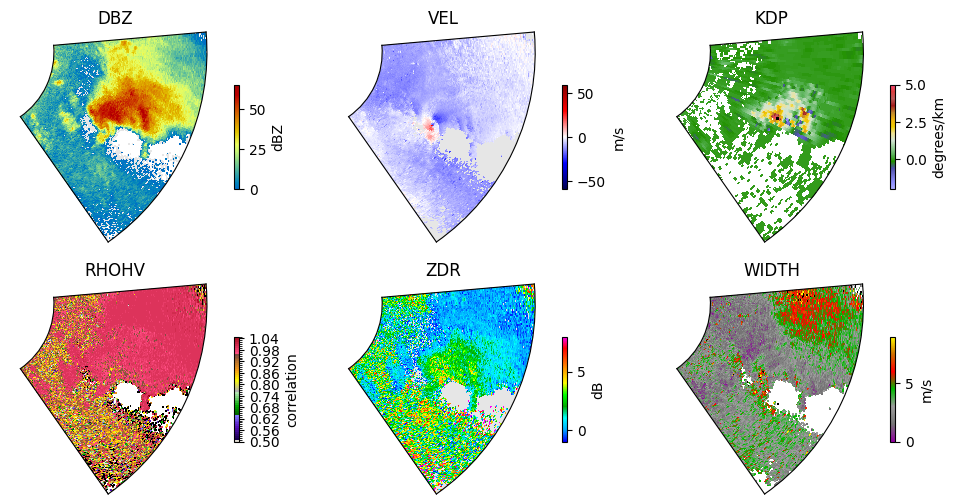

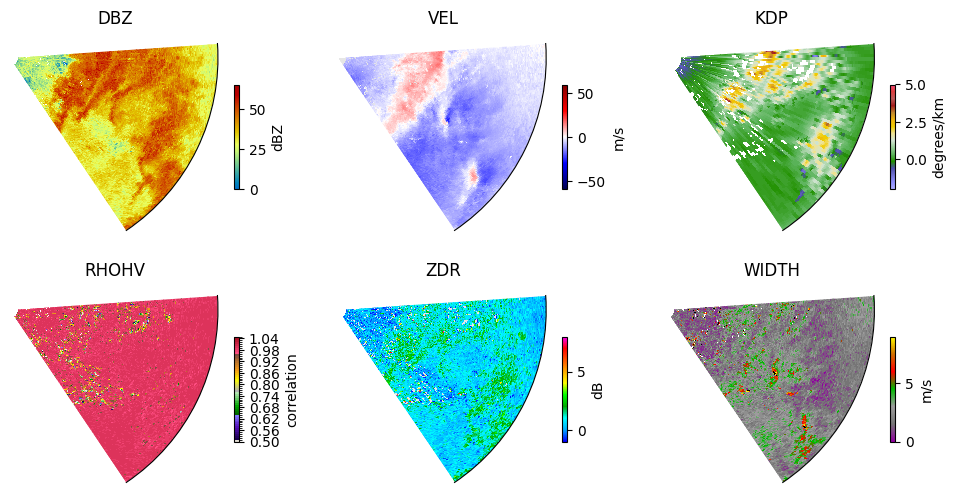

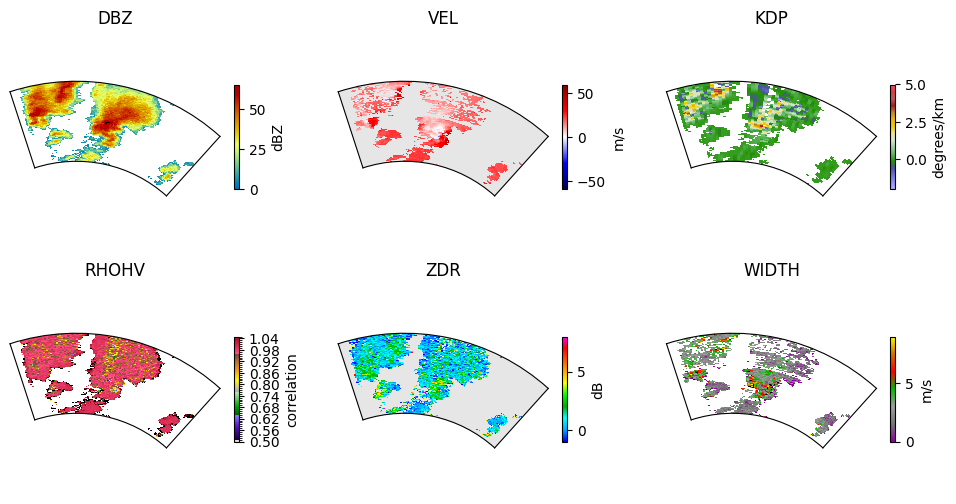

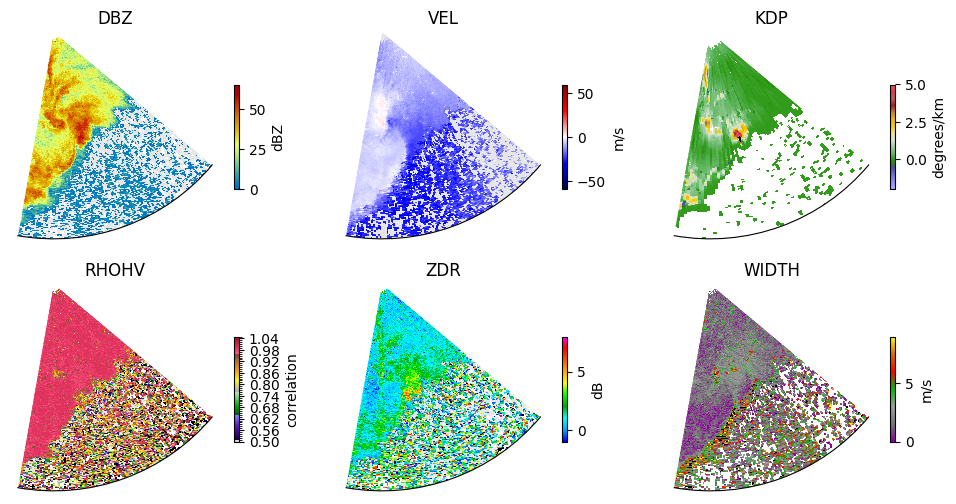

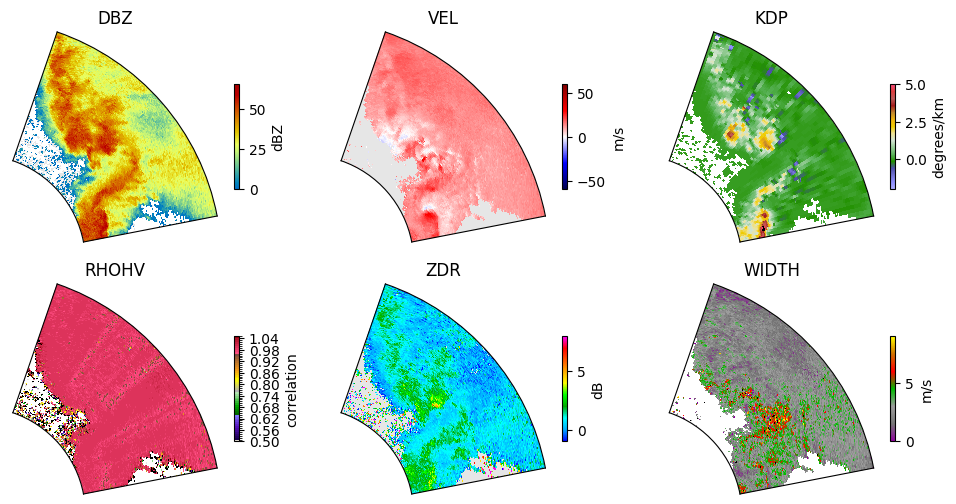

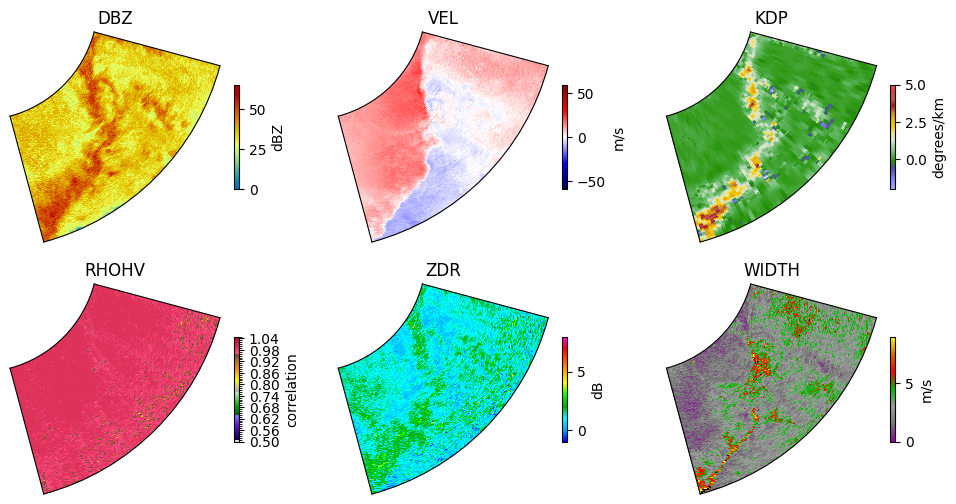

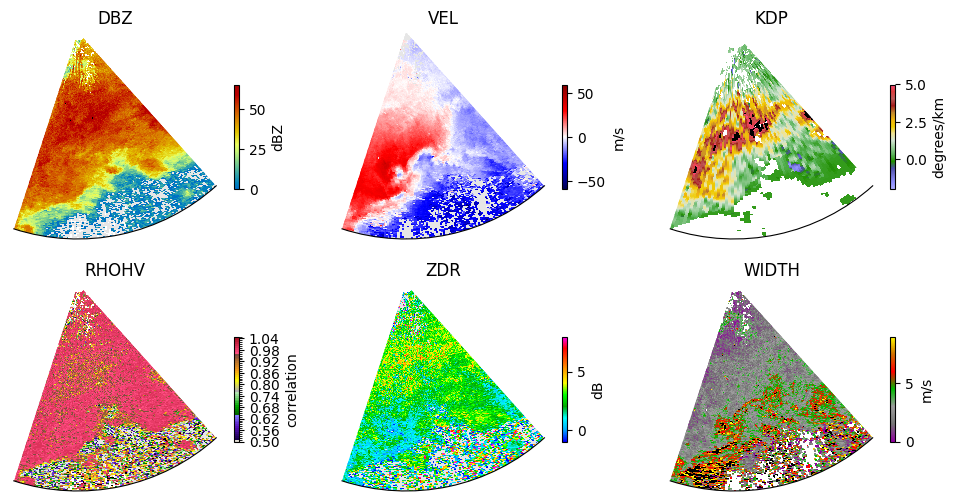

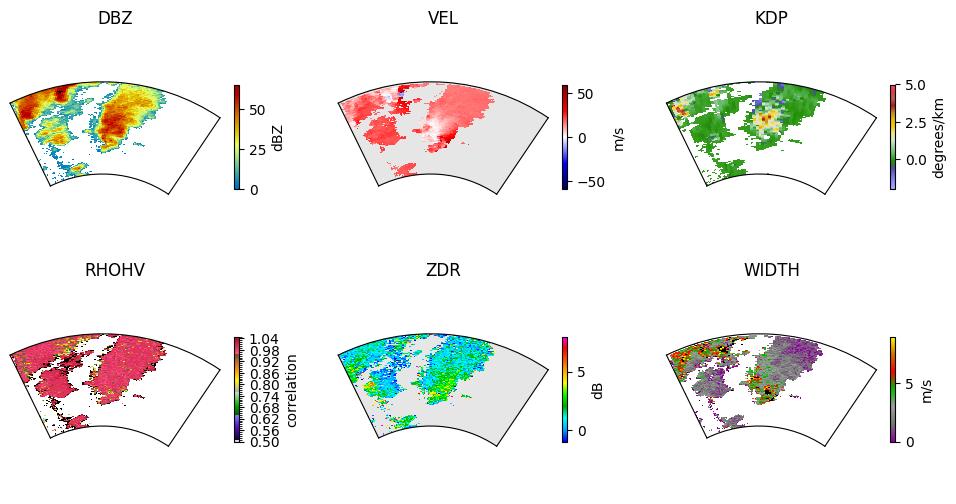

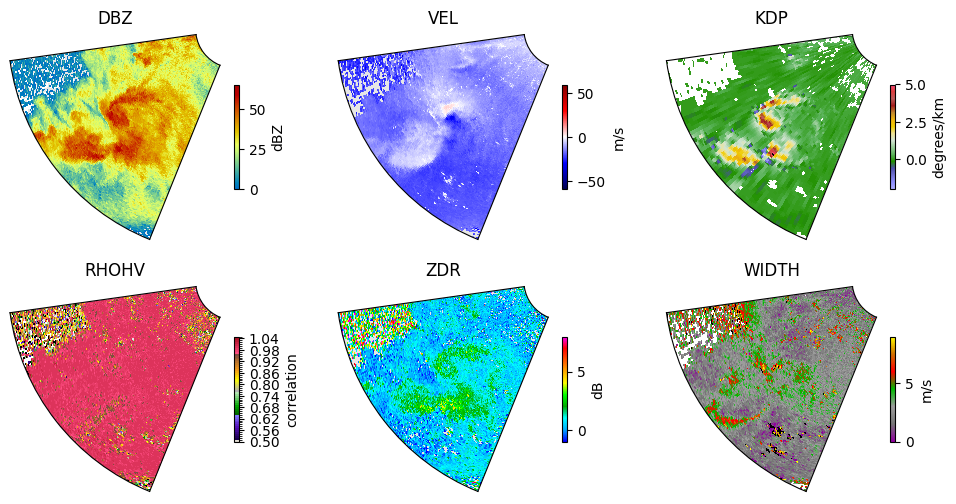

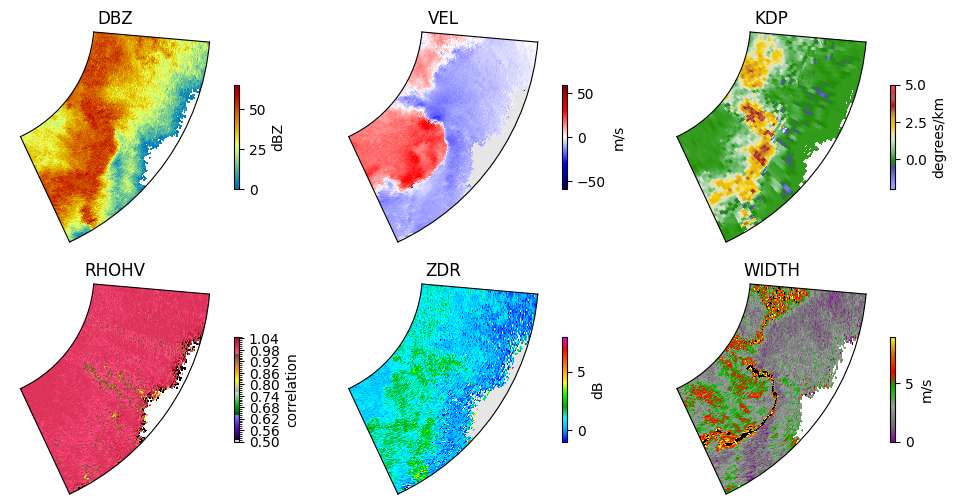

In [74]:
from tornet.data.loader import TornadoDataLoader
data_loader = TornadoDataLoader(file_list,variables=vars_to_plot,n_frames=4)
D_ROOT = "/mnt/d/tornetExamples"

counter = 0
for i in true_positives:
    if counter >= 10:
        break
    data = data_loader[i]
    
    fig = plt.figure(figsize=(12,6))
    
    plot_radar(data,
               fig=fig,
               channels=vars_to_plot,
               include_cbar=True,
               time_idx=-1,
               n_rows=2, n_cols=3)

    prob = np.exp(scores[i]) / (1. + np.exp(scores[i]))
    plt.savefig('{}/true_positives_{}.png'.format(D_ROOT, prob))
    plt.show()
    plt.close()
    counter += 1
    

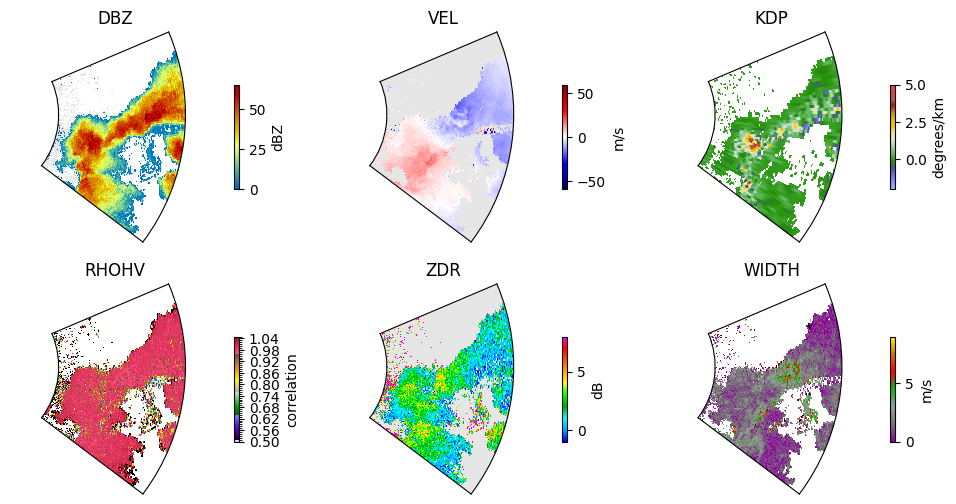

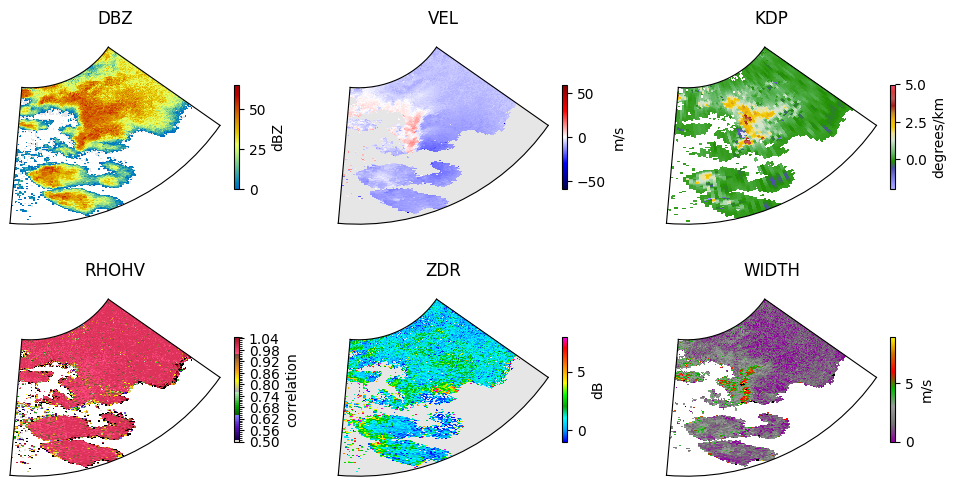

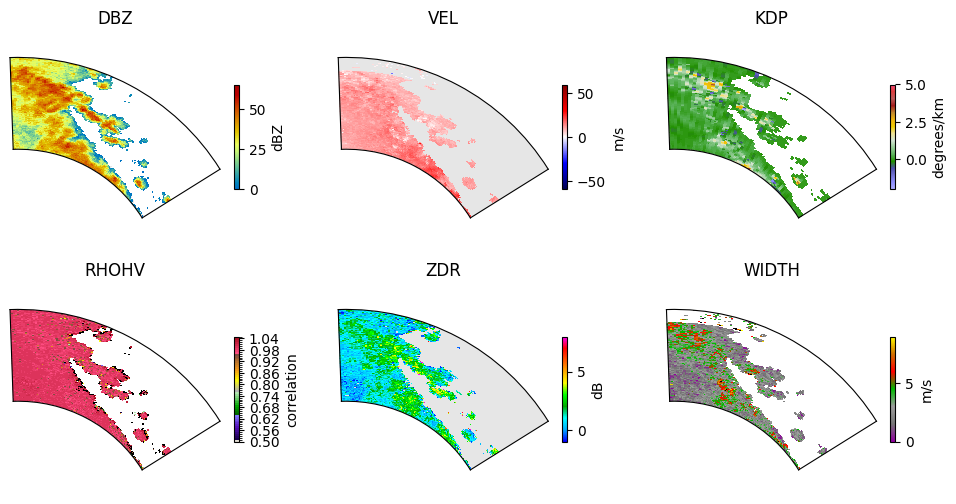

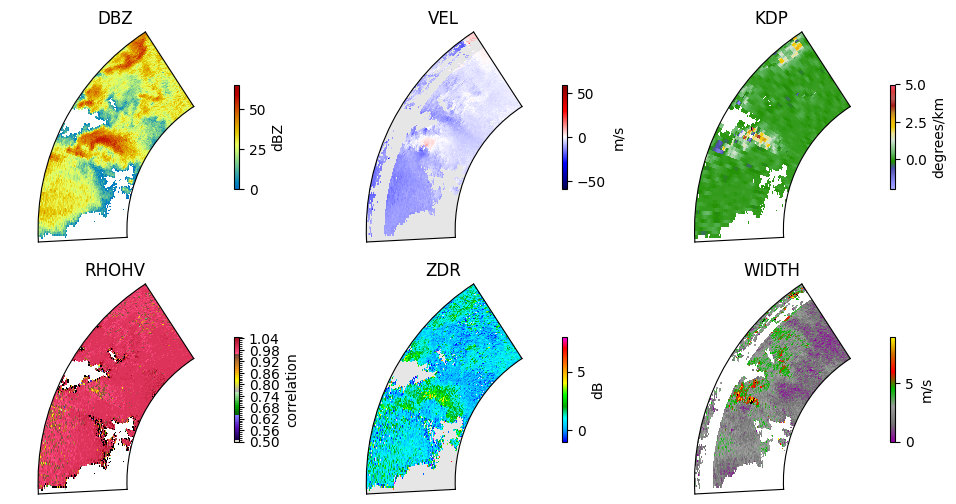

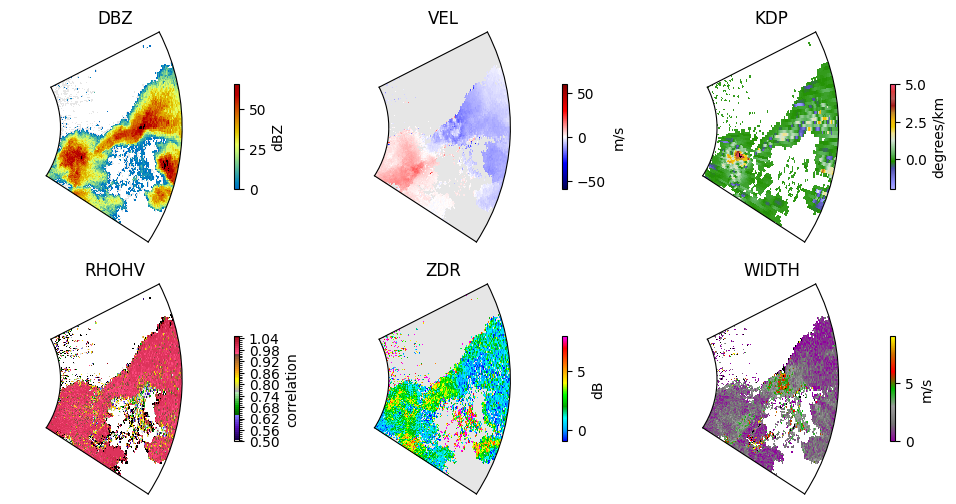

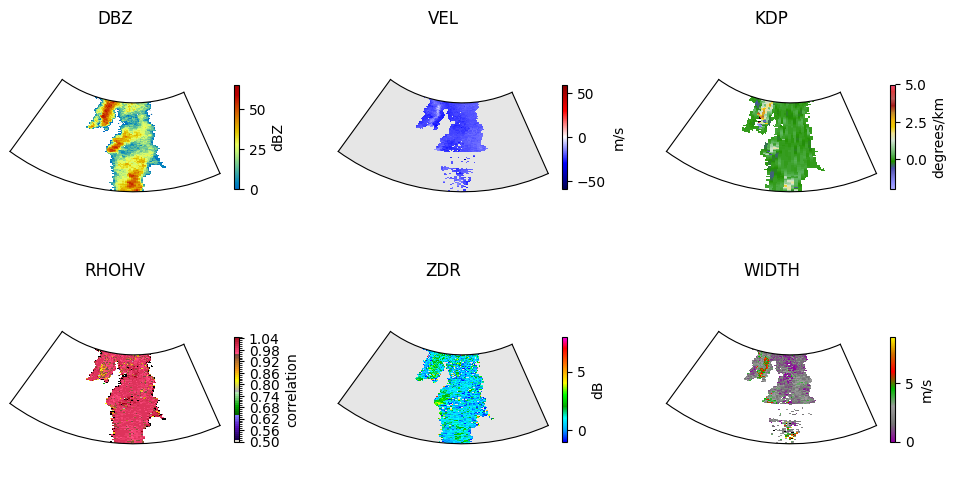

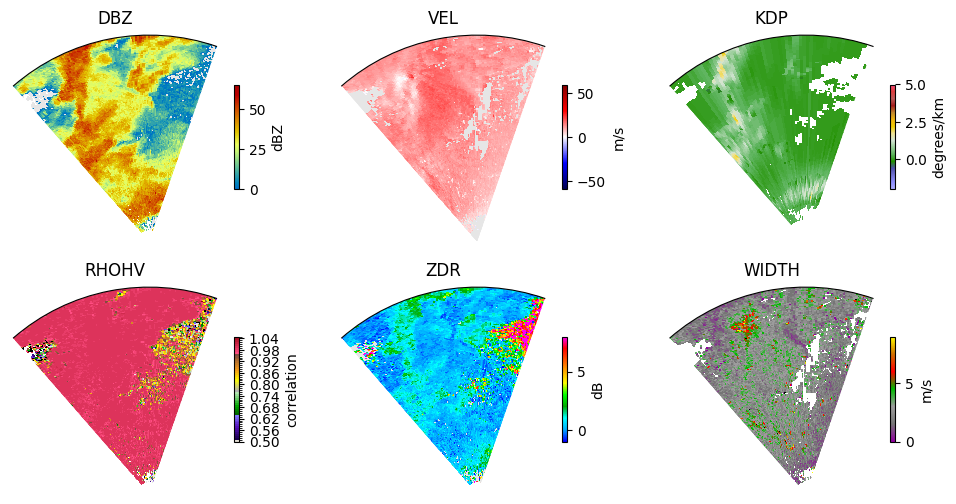

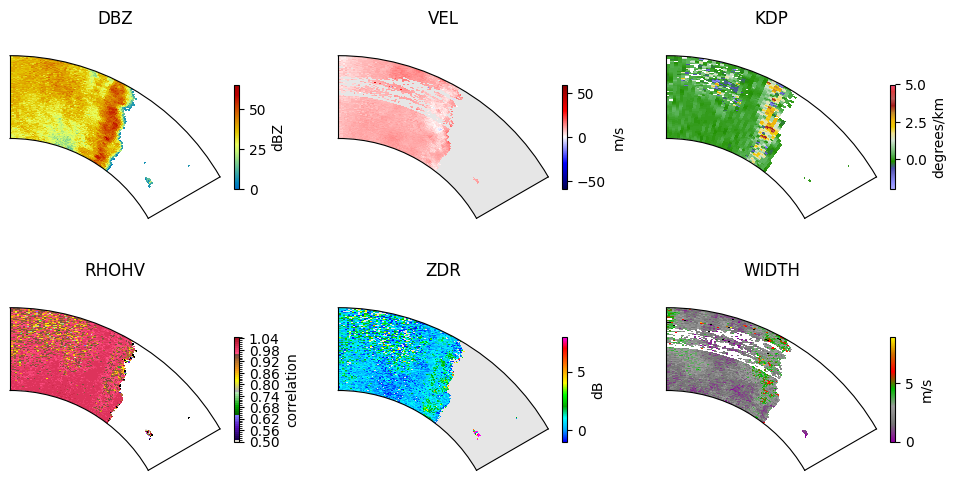

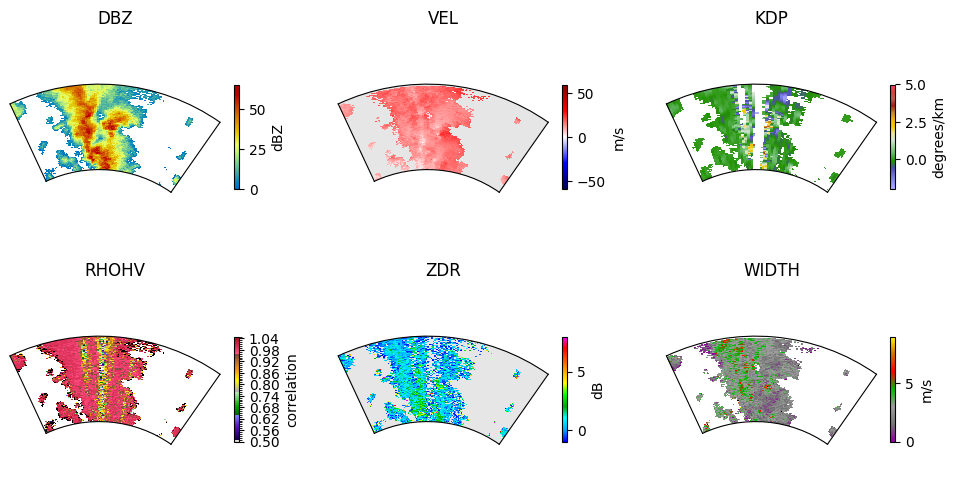

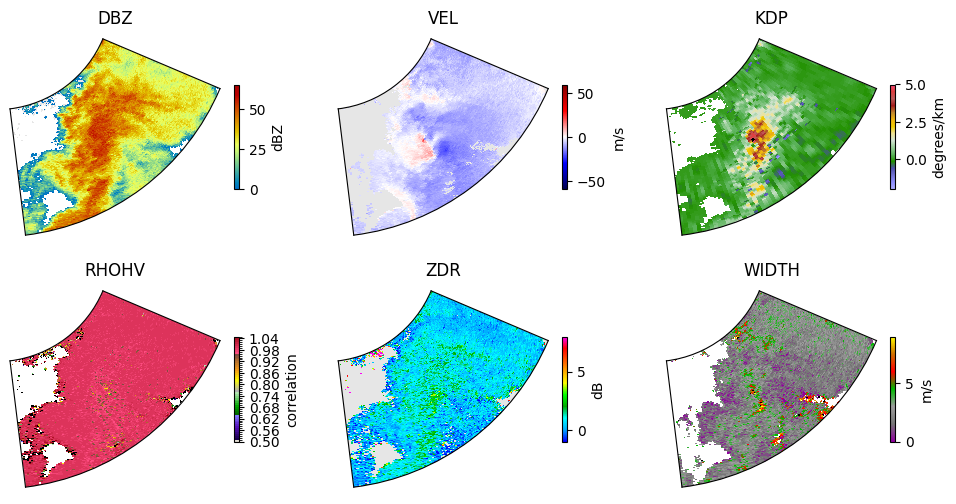

In [75]:
from tornet.data.loader import TornadoDataLoader
data_loader = TornadoDataLoader(file_list,variables=vars_to_plot,n_frames=4)

D_ROOT = "/mnt/d/tornetExamples"
counter = 0
for i in false_negatives:
    if counter >= 10:
        break
    data = data_loader[i]
    
    fig = plt.figure(figsize=(12,6))
    
    plot_radar(data,
               fig=fig,
               channels=vars_to_plot,
               include_cbar=True,
               time_idx=-1,
               n_rows=2, n_cols=3)

    prob = np.exp(scores[i]) / (1. + np.exp(scores[i]))
    plt.savefig('{}/false_negatives_{}.png'.format(D_ROOT, prob))
    plt.show()
    plt.close()
    counter += 1

Text(0, 0.5, 'Count of false positives for given probability')

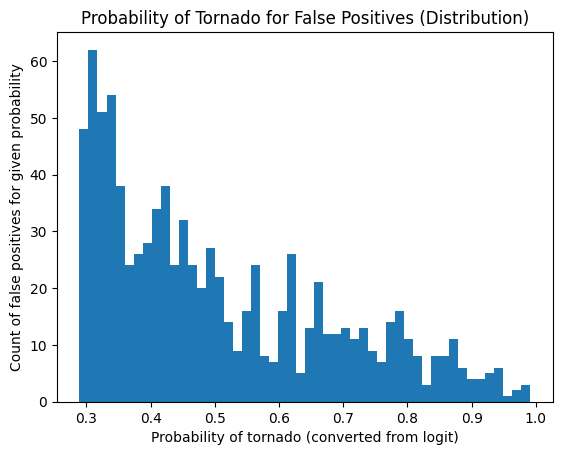

In [65]:
false_positive_scores = [(i, (np.exp(scores[i]) / (1. + np.exp(scores[i])).astype(float)).tolist()[0])  for i in false_positives]
plt.hist([x[1] for x in false_positive_scores], bins=50)
plt.title("Probability of Tornado for False Positives (Distribution)")
plt.xlabel("Probability of tornado (converted from logit)")
plt.ylabel("Count of false positives for given probability")

Text(0, 0.5, 'Count of true positives for given probability')

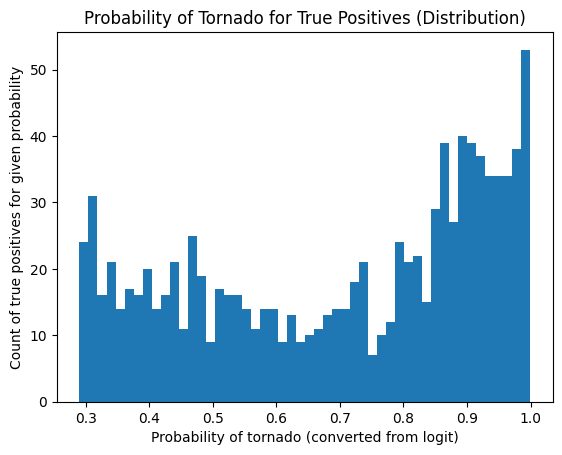

In [67]:
true_positive_scores = [(i, (np.exp(scores[i]) / (1. + np.exp(scores[i])).astype(float)).tolist()[0])  for i in true_positives]
plt.hist([x[1] for x in true_positive_scores], bins=50)
plt.title("Probability of Tornado for True Positives (Distribution)")
plt.xlabel("Probability of tornado (converted from logit)")
plt.ylabel("Count of true positives for given probability")

In [68]:
bad_false_positives = [x for x in false_positive_scores if x[1] > .9]

In [69]:
bad_false_positives

[(1361, 0.936409144896893),
 (1653, 0.9112032990516251),
 (3149, 0.936409144896893),
 (10074, 0.9252127146430309),
 (10388, 0.9379447125456697),
 (12334, 0.9277729442387617),
 (12464, 0.9041586290513123),
 (13312, 0.9356627951381901),
 (13459, 0.905846478478029),
 (14065, 0.905846478478029),
 (14068, 0.9900185408467106),
 (15667, 0.9406709491425995),
 (17265, 0.9301150881419132),
 (18217, 0.9126285105211479),
 (18517, 0.9641260171085113),
 (21375, 0.9613828397557407),
 (21459, 0.9422419642279761),
 (22208, 0.9912409851753247),
 (22928, 0.9183299613620064),
 (25415, 0.9183299613620064),
 (25615, 0.923600858610193),
 (27648, 0.9000306893549886),
 (27812, 0.9249550496509643),
 (28648, 0.9692171802009859),
 (29370, 0.9913916541235561)]

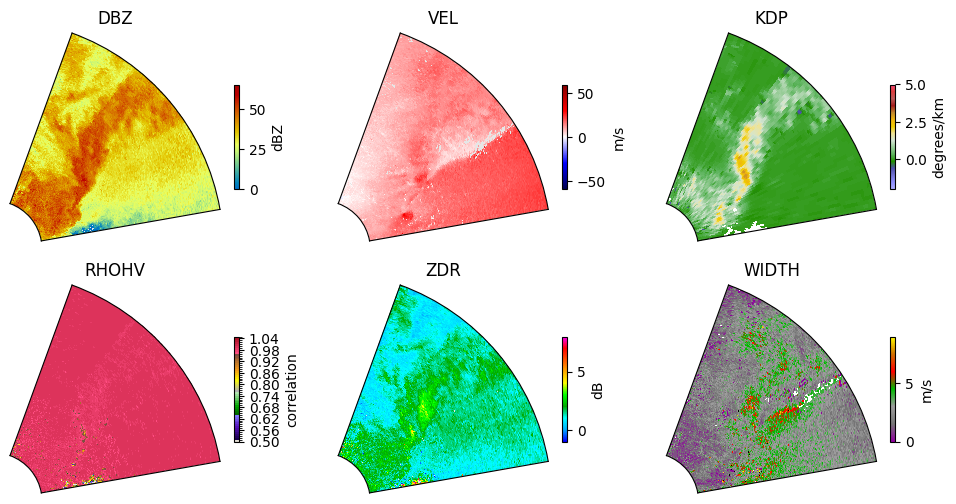

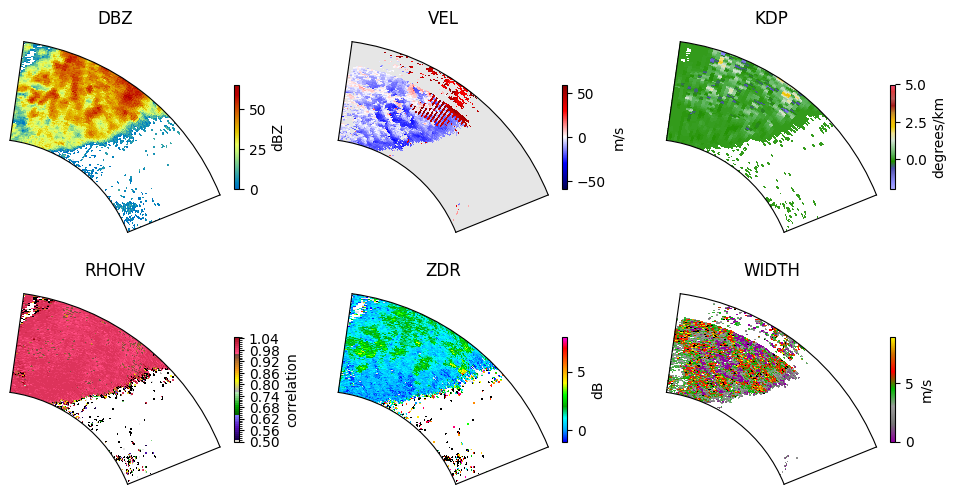

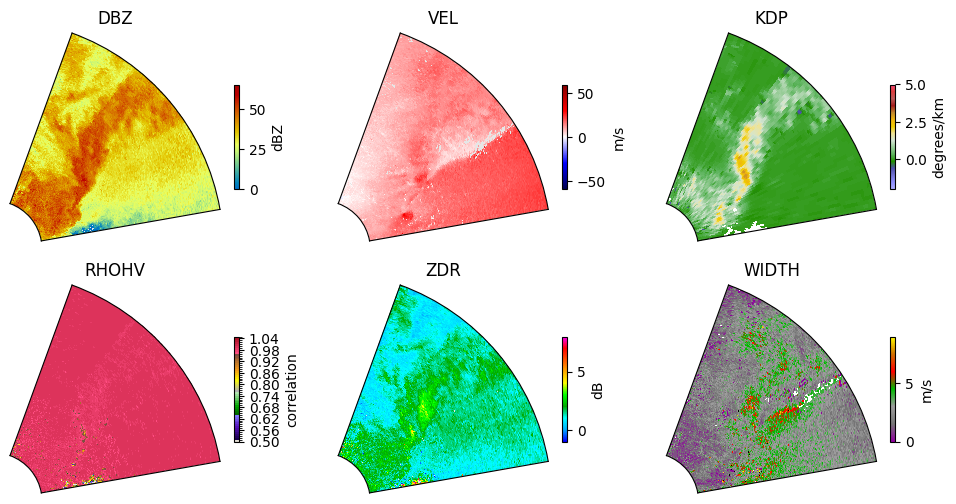

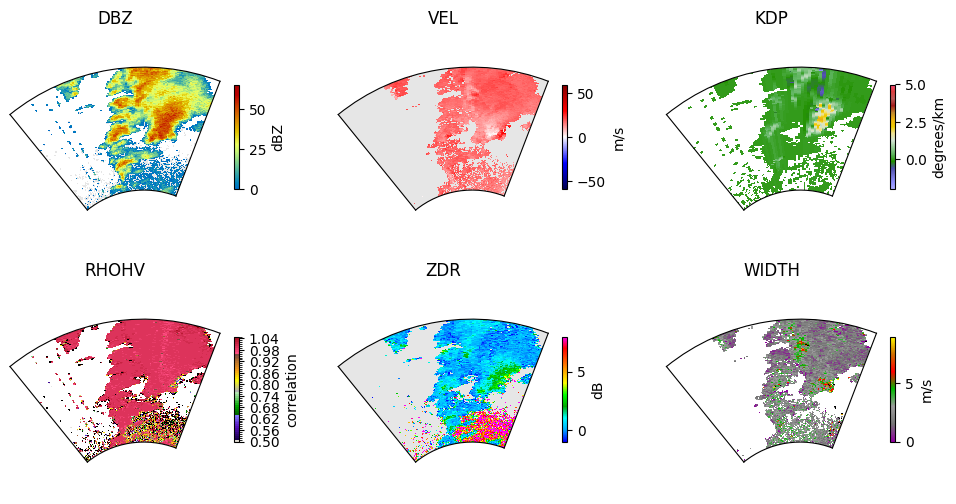

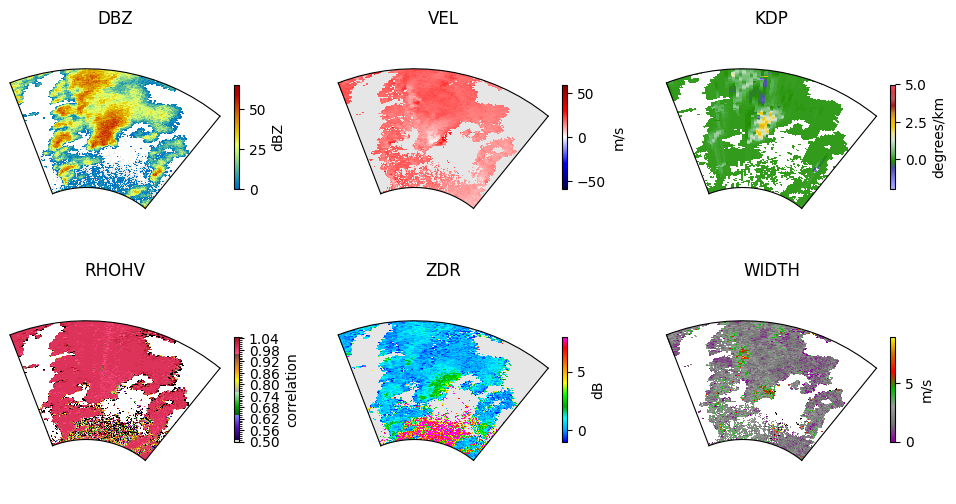

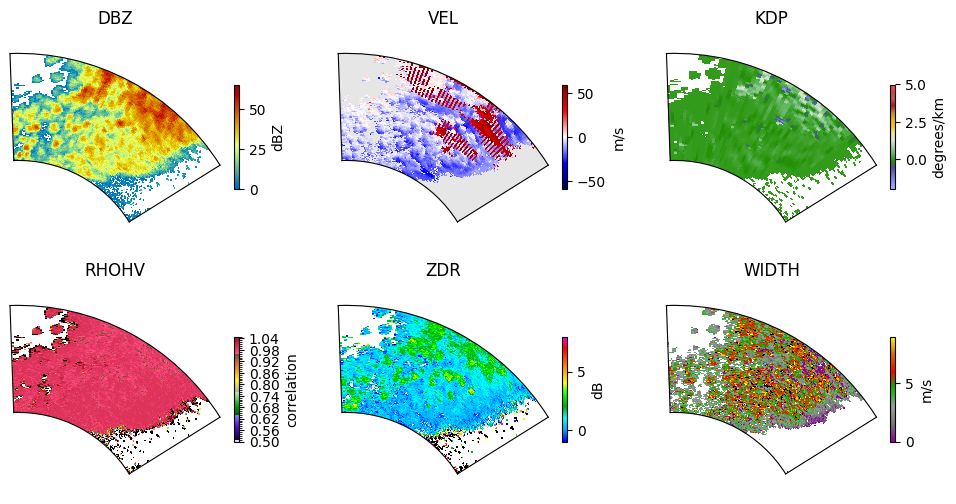

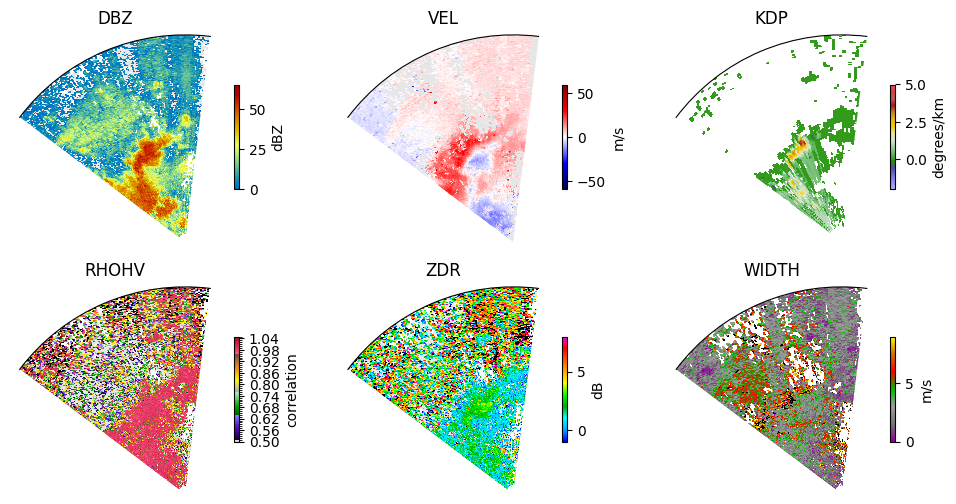

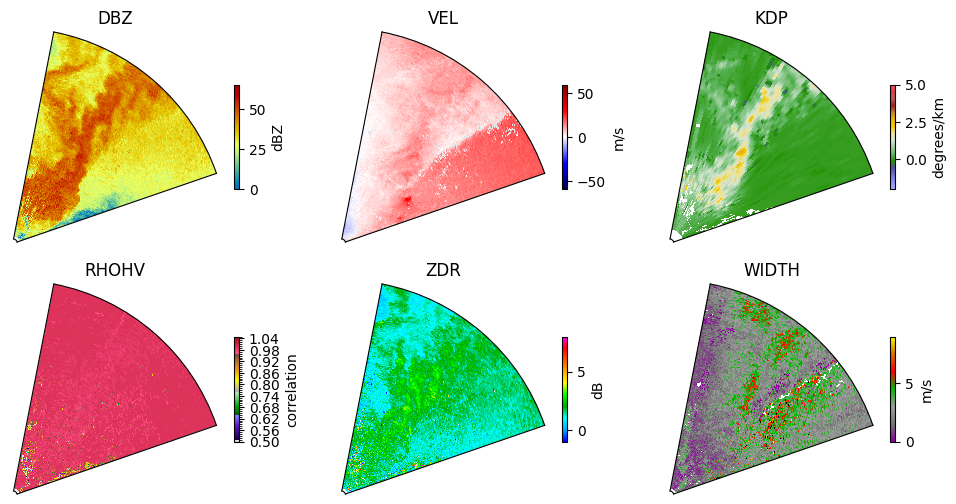

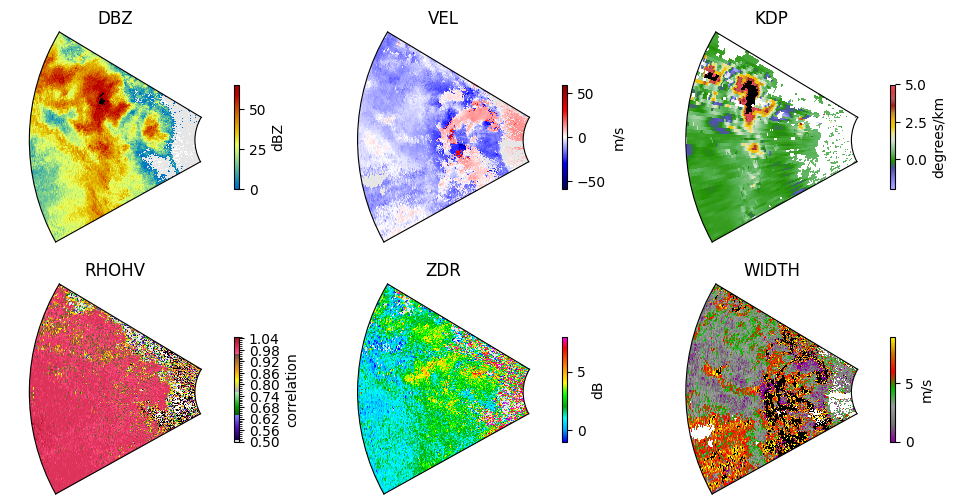

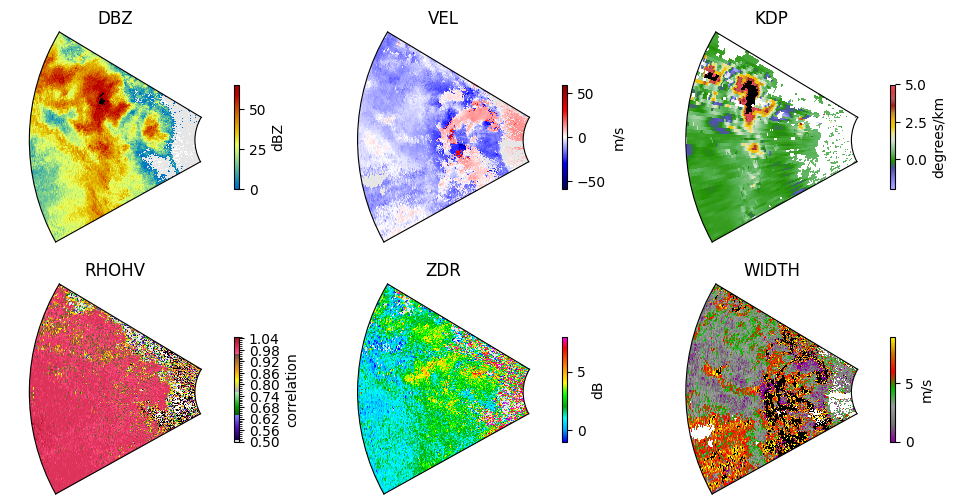

In [73]:
from tornet.data.loader import TornadoDataLoader
data_loader = TornadoDataLoader(file_list,variables=vars_to_plot,n_frames=4)

D_ROOT = "/mnt/d/tornetExamples"
vars_to_plot = ['DBZ', 'VEL', 'KDP', 'RHOHV', 'ZDR', 'WIDTH']
counter = 0
for i in [x[0] for x in bad_false_positives]:
    if counter >= 10:
        break
    data = data_loader[i]
    
    fig = plt.figure(figsize=(12,6))
    
    plot_radar(data,
               fig=fig,
               channels=vars_to_plot,
               include_cbar=True,
               time_idx=-1,
               n_rows=2, n_cols=3)

    prob = np.exp(scores[i]) / (1. + np.exp(scores[i]))
    plt.savefig('{}/bad_false_positives_{}.png'.format(D_ROOT, prob))
    plt.show()
    plt.close()
    counter += 1

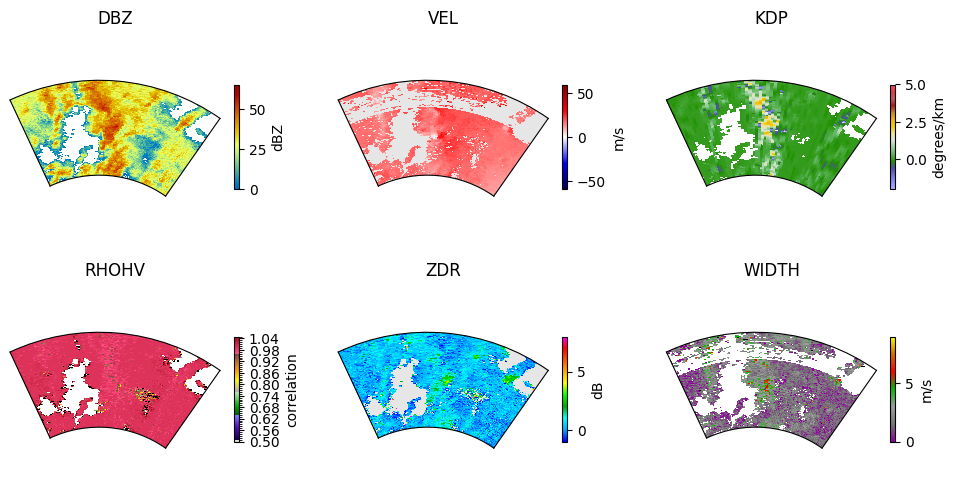

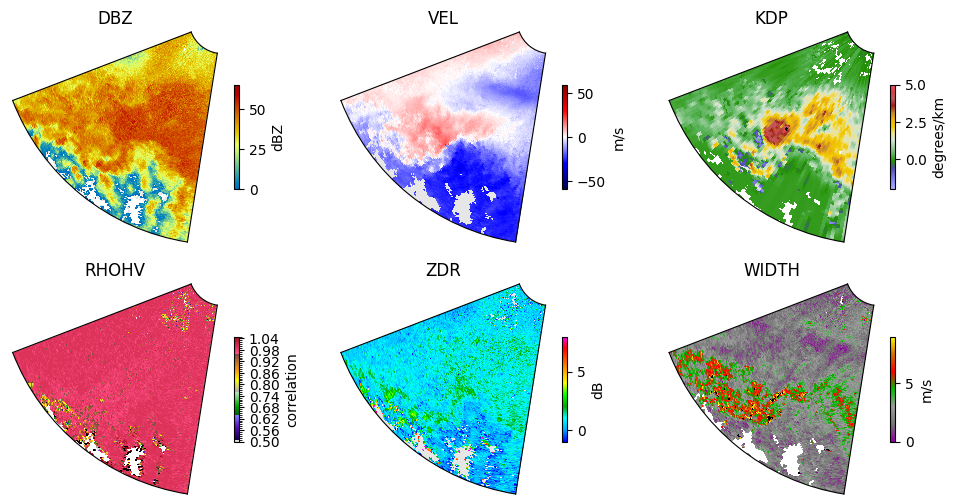

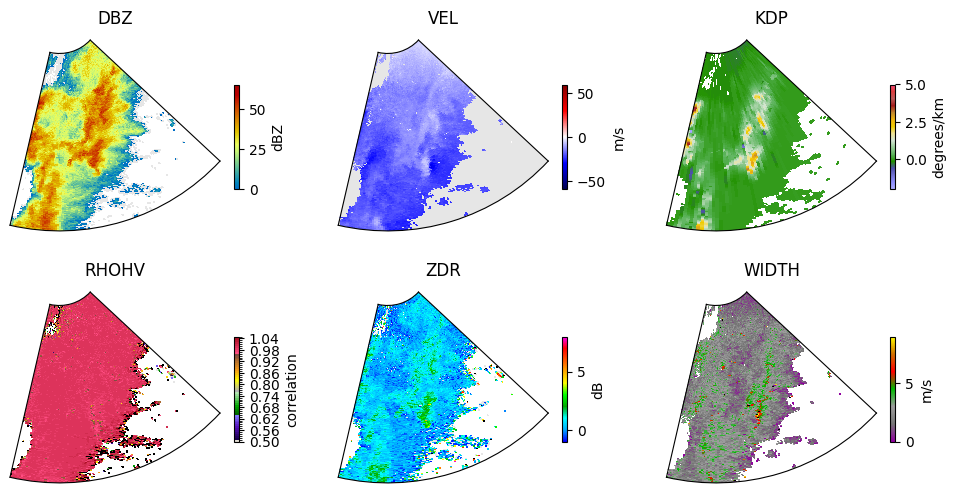

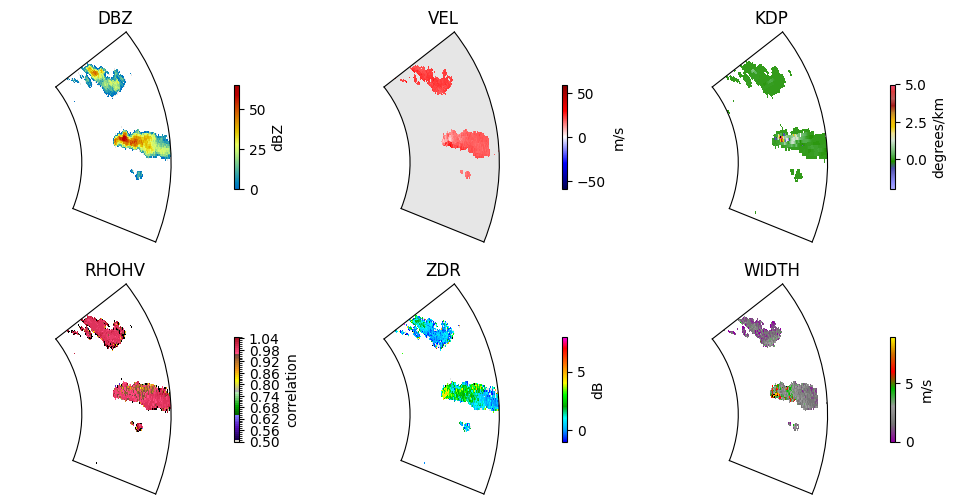

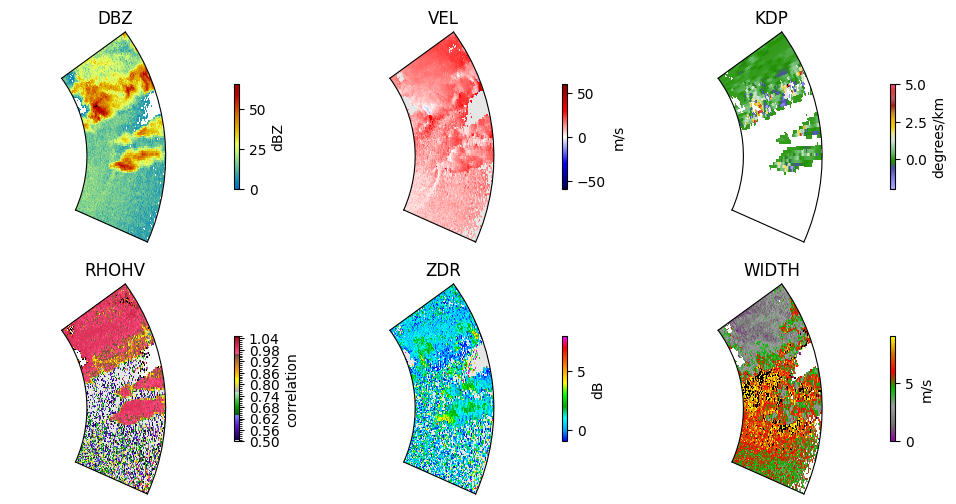

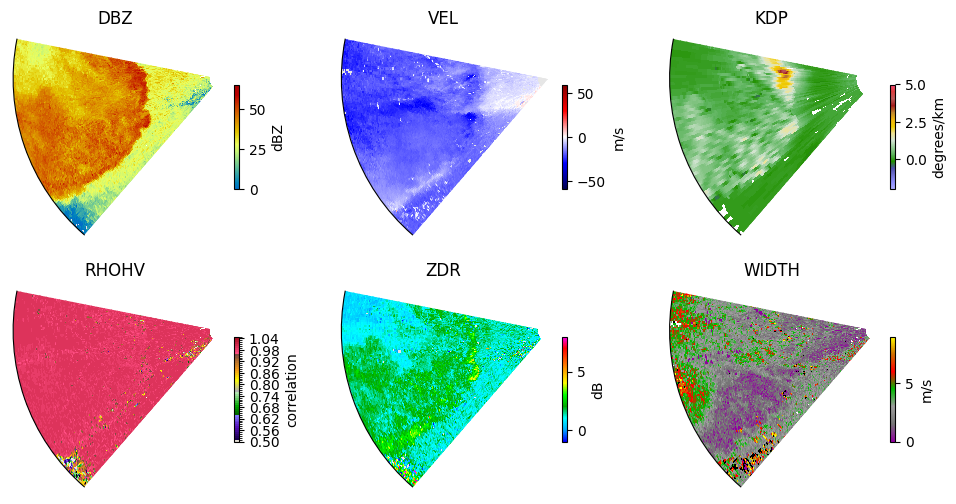

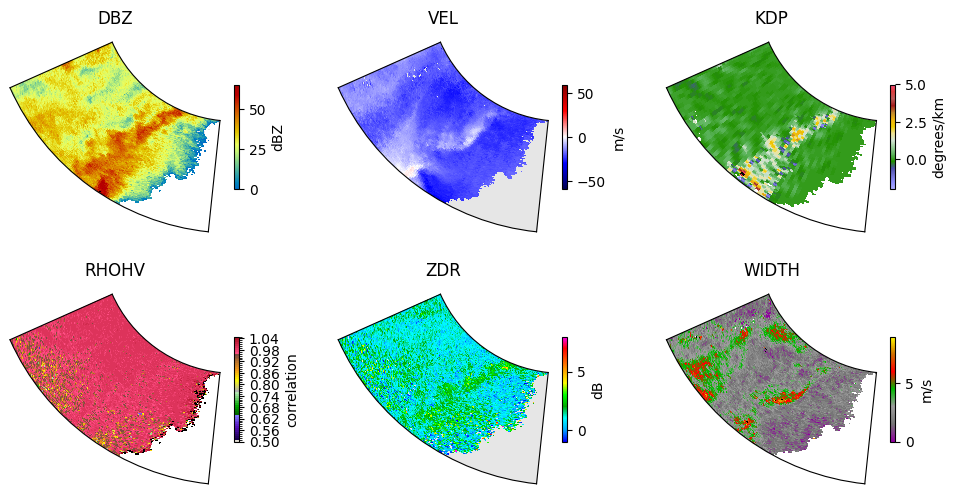

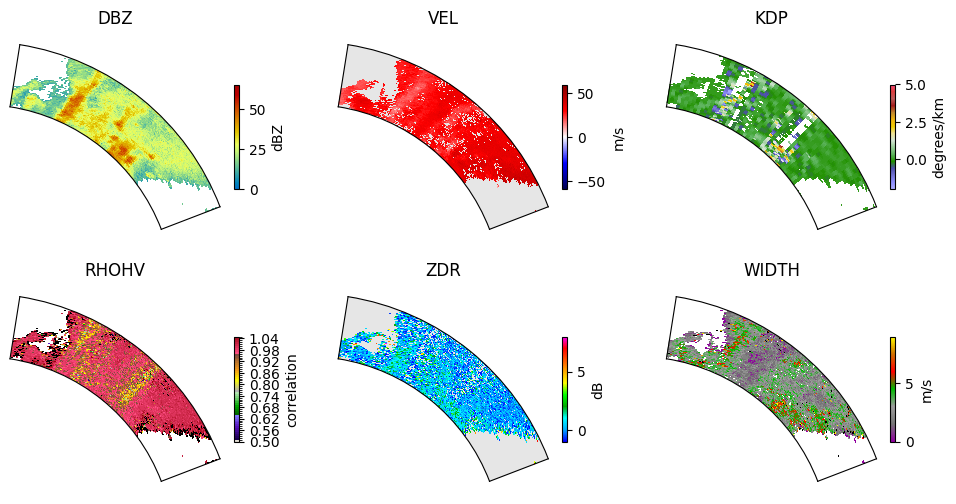

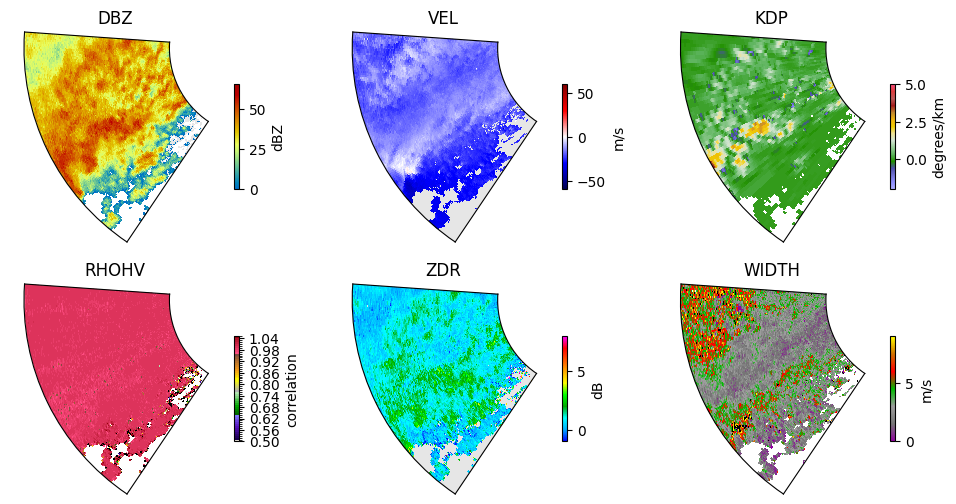

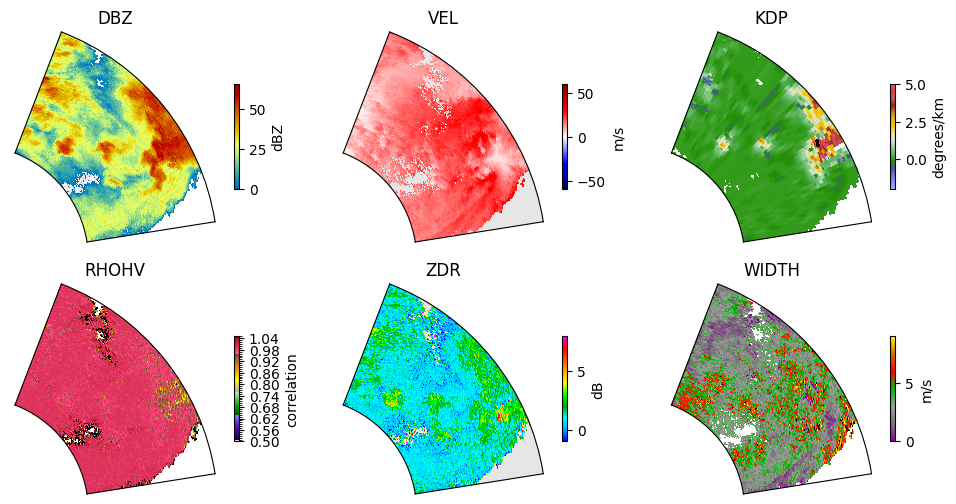

In [76]:
from tornet.data.loader import TornadoDataLoader
data_loader = TornadoDataLoader(file_list,variables=vars_to_plot,n_frames=4)

close_misses = [x for x in false_positive_scores if x[1] < .4]
D_ROOT = "/mnt/d/tornetExamples"

counter = 0
for i in [x[0] for x in close_misses]:
    if counter >= 10:
        break
    data = data_loader[i]
    
    fig = plt.figure(figsize=(12,6))
    
    plot_radar(data,
               fig=fig,
               channels=vars_to_plot,
               include_cbar=True,
               time_idx=-1,
               n_rows=2, n_cols=3)

    prob = np.exp(scores[i]) / (1. + np.exp(scores[i]))
    plt.savefig('{}/close_false_positives_{}.png'.format(D_ROOT, prob))
    plt.show()
    plt.close()
    counter += 1